# SF Employment Accessibility

Brian Hill, October 2020

In this notebook we take in 
- General Transit Feed Specification feeds from multiple agencies across the bay area
- Open Street Maps data for San Francisco 
- Cleaned population and employment geographical distribution data

And use the R library R5R for trip routing, adapted to a python 3 notebook using rpy2 cell magic, as well as a locally stored file system.  

The goal is to asses the impact of changes around the 4th and King station including a T-line subway extension, as well as a commuter rail (Caltrain) extension both to the core of SF downtown. For proof of concept, we display the changes resulting from running employment accessibility with and without regional metro transit provider BART.  As is seen, we simply recover the improved accessibility around the stops when assessing the marginal impact of the change.


<h1>Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Setup</a></span><ul class="toc-item"><li><span><a href="#Import-Libraries" data-toc-modified-id="Import-Libraries-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Import Libraries</a></span></li><li><span><a href="#GTFS-Data" data-toc-modified-id="GTFS-Data-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>GTFS Data</a></span></li><li><span><a href="#OSM-Data" data-toc-modified-id="OSM-Data-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>OSM Data</a></span></li><li><span><a href="#R-Interface" data-toc-modified-id="R-Interface-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>R Interface</a></span></li></ul></li><li><span><a href="#Create-Data" data-toc-modified-id="Create-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Create Data</a></span><ul class="toc-item"><li><span><a href="#Set-variable-path-names" data-toc-modified-id="Set-variable-path-names-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Set variable path names</a></span></li><li><span><a href="#Make-Hexagons" data-toc-modified-id="Make-Hexagons-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Make Hexagons</a></span></li><li><span><a href="#Attribute-Jobs-to-Hexagons" data-toc-modified-id="Attribute-Jobs-to-Hexagons-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Attribute Jobs to Hexagons</a></span></li></ul></li><li><span><a href="#R5R-Travel-Times" data-toc-modified-id="R5R-Travel-Times-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>R5R Travel Times</a></span><ul class="toc-item"><li><span><a href="#Setup-R5R" data-toc-modified-id="Setup-R5R-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Setup R5R</a></span></li><li><span><a href="#Pre-Times" data-toc-modified-id="Pre-Times-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Pre Times</a></span></li><li><span><a href="#Post-Times" data-toc-modified-id="Post-Times-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Post Times</a></span></li></ul></li><li><span><a href="#Calculate-Accessibility--" data-toc-modified-id="Calculate-Accessibility---4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Calculate Accessibility  <a class="anchor" id="calculate_acessibility"></a></a></span><ul class="toc-item"><li><span><a href="#Save-Summary-Data" data-toc-modified-id="Save-Summary-Data-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Save Summary Data</a></span></li><li><span><a href="#Negative-Value-Checks" data-toc-modified-id="Negative-Value-Checks-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Negative Value Checks</a></span></li></ul></li><li><span><a href="#Data-Visualization-" data-toc-modified-id="Data-Visualization--5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Data Visualization <a class="anchor" id="data_vis"></a></a></span><ul class="toc-item"><li><span><a href="#Employment-Plot" data-toc-modified-id="Employment-Plot-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Employment Plot</a></span></li><li><span><a href="#Plot-Any-Column-in-acc" data-toc-modified-id="Plot-Any-Column-in-acc-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Plot Any Column in acc</a></span></li><li><span><a href="#Acessibility-Total-Plot-(pre-data)" data-toc-modified-id="Acessibility-Total-Plot-(pre-data)-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Acessibility Total Plot (pre data)</a></span></li><li><span><a href="#Acessibility-Change" data-toc-modified-id="Acessibility-Change-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>Acessibility Change</a></span></li></ul></li><li><span><a href="#Scratchwork" data-toc-modified-id="Scratchwork-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Scratchwork</a></span></li></ul></div>

## Setup 

### Import Libraries

In [1]:
# Load rpy2 (if do not have, instructions below)
%load_ext rpy2.ipython

In [2]:
# Import libraries
import numpy as np
import pandas as pd
import geopandas as gpd
import time
import os
import math
# Plotting libraries
import matplotlib.pyplot as plt
from geopy.distance import geodesic
from matplotlib.patches import RegularPolygon
import seaborn as sns
import shapely 
from shapely.geometry import Polygon
import contextily as ctx
# Suppresss warnings 
import warnings
warnings.filterwarnings('ignore')
# Retina display
%config InlineBackend.figure_format = 'retina'


In [3]:
gpd.__version__

'0.8.1'

### GTFS Data 

One option is to obtain a regional bay area feed from https://www.interline.io/blog/mtc-regional-gtfs-feed-additions/#download-historical-feed-products 

For now, we use individual feeds for networks across the SF bay area to explore the direct impact of running with and without one entire provider, BART.

### OSM Data 

We use an extract from bbbike capturing the peninsula of San Francisco County & City. 
    

### R Interface

To interact with the cells, I used the rpy2 package.  To install, it is neccesary to: 

1) Download R appropriate for your OS (for me mac 3.6.3): https://mirror.las.iastate.edu/CRAN/

2) Install R, ensuring it is appropriate for your operating system. 

3) On mac, run "pip install rpy2"  NOTE: may be neccesary to run "sudo pip install rpy2.  Check out this video for setup: https://www.youtube.com/watch?v=xNB9FVt9ogw

4) Install cell magic and test loading in a library


In [4]:
# Load rpy2 (if do not have, instructions below)
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [5]:
%R require(ggplot2)

R[write to console]: Loading required package: ggplot2



array([1], dtype=int32)

Note that the R interface is similar to that of the bash cell magic, in that you can pass in variables in one line using {} and in the %% setup using -i inputs, -o outputs.  Otherwise, the variables in the R cells ARE NOT ACCESSIBLE by the regular python cells.

More details here: https://rpy2.github.io/doc/v3.2.x/html/interactive.html#usage

In [6]:
python_var = 20

In [7]:
%R print(python_var)

R[write to console]: Error in print(python_var) : object 'python_var' not found




Error in print(python_var) : object 'python_var' not found


In [8]:
%R print({python_var})

[1] 20


array([20.])

In [9]:
%%R 
print({python_var})

R[write to console]: Error in print({ : object 'python_var' not found




Error in print({ : object 'python_var' not found


In [10]:
%R python_var = {python_var}

array([20.])

In [11]:
%R print(python_var)

[1] 20


array([20.])

In [12]:
python_var_2 = 'dab'

In [13]:
%%R -i python_var_2
print(python_var_2)

[1] "dab"


In [14]:
%%R -o python_var_2
python_var_2 = 'dab dab'

In [15]:
python_var_2

array(['dab dab'], dtype='<U7')

## Create Data

### Set variable path names 
We first clear past graph objects to rebuild graphs with new GTFS feeds.

In [4]:
%%bash 
cd graphs
cd pre
rm *.mapdb.p
rm *.mapdb
rm network.dat
cd ..
cd post
rm *.mapdb.p
rm *.mapdb
rm network.dat

In [5]:
# Location to find city-specific data (e.g. jobs, administrative boundaries)
city_data = r'sf_data/'

# Location to store run-specific data
run_folder_name = r'runs/bart_test_v2'
# We now make this directory
!mkdir {run_folder_name}

# Prefix to add to files from this run 
run_prefix = 'bart_test_'  #ENDS IN UNDERSCORE USUALLY

# Together
run_path = run_folder_name + '/' + run_prefix
run_path


'runs/bart_test_v2/bart_test_'

### Make Hexagons

In [6]:
# df_to_numeric
# INPUTS: dataframe 
# OUTPUTS: dataframe with numeric columns everywhere possible
def df_to_numeric(df) :
    for col in df.columns :
        try : 
            df[col] = pd.to_numeric(df[col])
        except :
            continue
    return df 


In [7]:
# to_hex
# Input: geodataframe covering area of interest, hexagon diameter
# Output: geodataframe of hexagons overlaid over area
def to_hex(area, d) :
    # area: GeoDataFrame with geometry column of pologyons to hexagonize
    # d: diameter
    print("Diameter of hexagons: ", d, " meters")

    # How large is the city?
    xmin, ymin, xmax, ymax = area.total_bounds
    dist_long = geodesic((ymin,xmin), (ymin,xmax)).km*1000
    # print("Longitudinal distance:", dist_long)
    dist_lat = geodesic((ymin,xmin), (ymax,xmin)).km*1000
    # print("Latitudinal distance:", dist_lat)

    # Horizontal width of hexagon
    w = np.sin(np.deg2rad(60))*d

    # Approximate size of hexagon grid 
    n_cols = int(dist_long/w) +1
    # print("Approx. number of columns: ", n_cols)
    n_rows = int(dist_lat/(3/4 * d)) + 10
    # print("Approx. number of rows:", n_rows)

    # Overlay with equally spaced hexagons
    # ax = area.boundary.plot(edgecolor='black',figsize=(20,60))
    w = (xmax-xmin)/n_cols # width of hexagon
    d = w/np.sin(np.pi/3) #diameter of hexagon
    array_of_hexes = []
    for rows in range(0,n_rows):
        hcoord = np.arange(xmin,xmax,w) + (rows%2)*w/2
        vcoord = [ymax- rows*d*0.75]*n_cols
        for x, y in zip(hcoord, vcoord):#, colors):
            hexes = RegularPolygon((x, y), numVertices=6, radius=d/2, alpha=0.2, edgecolor='k')
            verts = hexes.get_path().vertices
            trans = hexes.get_patch_transform()
            points = trans.transform(verts)
            array_of_hexes.append(Polygon(points))
            # ax.add_patch(hexes)
    #ax.set_xlim([xmin, xmax])
    #ax.set_ylim([ymin, ymax])
    #plt.show()

    # Extract hexagons inside of the boundary 

    hex_grid = gpd.GeoDataFrame({'geometry':array_of_hexes},crs={'init':'epsg:4326'})
    area_hex = gpd.overlay(hex_grid,area)
    area_hex = gpd.GeoDataFrame(area_hex,geometry='geometry')
    #area_hex.boundary.plot()

    # Strip off unnecesary fields 
    area_hex.reset_index(inplace=True)
    area_hex.rename(columns={'index':'HEXID'},inplace=True)
    area_hex.drop(columns='id', inplace=True)
    #area_hex = area_hex[['HEXID','geometry']]
    print('Total hexagons: ', len(area_hex))
    return area_hex


Diameter of hexagons:  250  meters
Total hexagons:  2642


<AxesSubplot:>

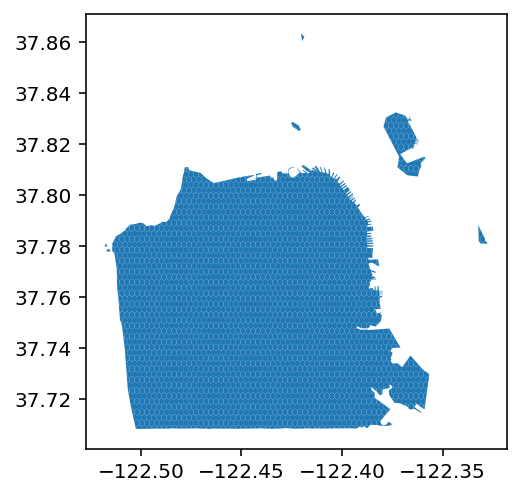

In [8]:
# Set Diameter
hexagon_diameter = 250 #meters
# Load counties
counties = gpd.read_file('sf_data/sf_bay_area_counties_uc_berkeley.json')
counties.boundary.crs = {'init':'epsg:4326'}
sf_counties = gpd.GeoDataFrame(counties, geometry='geometry')
#hex_geometry = to_hex(sf_counties, hexagon_diameter)  # Whole Bay Area
hex_geometry = to_hex(sf_counties[sf_counties['COUNTY']=='San Francisco'], hexagon_diameter)  # Only San Francisco

# Drop Falron Islands 
hex_geometry = hex_geometry[(hex_geometry['geometry'].centroid.x > -122.9) | (hex_geometry['geometry'].centroid.y > 37.85)]
hex_geometry.plot()


### Attribute Jobs to Hexagons

In [9]:
# LOAD DENSITY DATA

bay_area = pd.read_hdf('sf_data/bay_area_ua_data.h5')

display(bay_area[['x','y','persons','jobs']].describe())

# plt.figure(figsize=(25,25))
# sns.scatterplot(x='x',y='y',size='persons', data=bay_area)

bay_area_people = bay_area[['x','y','persons','jobs']]
# bay_area_people['people'] = bay_area_people['persons'] + bay_area_people['jobs']
bay_area_people.reset_index(inplace=True)
bay_area_people.rename(columns={'x':'longitude','y':'latitude','index':'id'},inplace=True)
bay_area_people = gpd.GeoDataFrame(bay_area_people, geometry=gpd.points_from_xy(bay_area_people.longitude, bay_area_people.latitude))
bay_area_people



,x,y,persons,jobs
count,109228.000000,109228.000000,109228.000000,109228.000000
mean,-122.170631,37.804041,61.719175,29.636879
std,0.309404,0.375120,114.484726,242.312286
min,-123.528897,36.903930,0.000000,0.000000
25%,-122.360536,37.523378,0.000000,0.000000
50%,-122.138105,37.777820,23.000000,0.000000
75%,-121.952649,38.013067,80.000000,4.000000
max,-121.213353,38.853940,3130.000000,35301.000000


,id,longitude,latitude,persons,jobs,geometry
0,060014001001000,-122.231654,37.879012,0.0,0.0,POINT (-122.23165 37.87901)
1,060014001001001,-122.234077,37.881846,0.0,0.0,POINT (-122.23408 37.88185)
2,060014001001002,-122.229372,37.880514,0.0,0.0,POINT (-122.22937 37.88051)
3,060014001001003,-122.239048,37.883088,0.0,0.0,POINT (-122.23905 37.88309)
4,060014001001004,-122.238373,37.882880,0.0,0.0,POINT (-122.23837 37.88288)
...,...,...,...,...,...,...
109223,060979901000006,-123.151621,38.414757,0.0,0.0,POINT (-123.15162 38.41476)
109224,060979901000007,-123.120270,38.415516,0.0,0.0,POINT (-123.12027 38.41552)
109225,060979901000008,-123.109852,38.390020,0.0,0.0,POINT (-123.10985 38.39002)
109226,060979901000009,-123.142469,38.387169,0.0,0.0,POINT (-123.14247 38.38717)


In [10]:
# Attribute people to each hexagon
bay_area_people.crs = {'init':"epsg:4686"}
hex_geometry.crs = {'init':"epsg:4686"}
joined = gpd.sjoin(bay_area_people, hex_geometry, how='left', op='intersects')
hex_jobs_raw = joined[['persons','jobs','HEXID']].groupby('HEXID').sum()
hex_jobs_raw.fillna(0, inplace=True)

In [11]:
# add_lat_lon
# Inputs: geodataframe with polygon geometry
# Outputs: geodataframe with polygon geometry but centroid, lon, lat columns
def add_lat_lon(gdf) :
    # Non-projected
    gdf['centroid'] = gdf.centroid
    gdf['lon'] = gdf['centroid'].x
    gdf['lat'] = gdf['centroid'].y
    # projected
    p_gdf = gdf
    p_gdf.crs = {'init':'epsg:4326'}
    p_gdf = p_gdf.to_crs(epsg=3857)
    p_gdf['geometry'] = p_gdf.centroid
    gdf['p_lon'] = p_gdf.geometry.x
    gdf['p_lat'] = p_gdf.geometry.y
    return gdf

In [12]:
# Merge and Save data
cols_to_keep = hex_geometry.columns.difference(hex_jobs_raw.columns).tolist()
hex_jobs = pd.merge(hex_jobs_raw, hex_geometry[cols_to_keep], right_index=True,left_index=True, how='outer')
hex_jobs['id'] = hex_jobs['HEXID']
hex_jobs = gpd.GeoDataFrame(hex_jobs, geometry='geometry')
hex_jobs = add_lat_lon(hex_jobs)
hex_jobs.fillna(0,inplace=True)
# Save to run directory
pd.DataFrame(hex_jobs.drop(columns=['geometry','centroid'])).to_csv(run_path + 'hex_jobs.csv')
hex_jobs.drop(columns=['centroid']).to_file(run_path + 'hex_jobs.geojson',driver='GeoJSON')



## R5R Travel Times 

NOTE: Java garbage collection seems not to work, should it return "Java Heap Error", close and reopen the notebook.  If that does not work, close and restart the browser.  If that does not work, close and restart the computer.  Not the best scheme, but an option.  Should work if make R notebook and copy and paste it.

Run the cell below if you have never used R5R in a jupyter notebook before. 

### Setup R5R

### Pre Times

In [13]:
# Save info on zip files used in before and after run, for future refrence
!ls graphs/pre | cat > {run_path}pre_router.txt
!ls graphs/post | cat > {run_path}post_router.txt

In [14]:
%%R -i run_path

router = 'pre'
options(java.parameters = "-Xmx8G")

# 1) build transport network, pointing to the path where OSM and GTFS data are stored
library(r5r)
path = gsub(" ", "", paste('graphs/', router))
print(path)
options(java.parameters = "-Xmx8G")
print('Building graph (core)')
r5r_core <- setup_r5(data_path = path, verbose = TRUE)

# # 2) load origin/destination points and set arguments
points_path = gsub(" ", "", paste(run_path, 'hex_jobs.csv'))
points <- read.csv(points_path)
mode <- c("WALK", "BUS", "TRANSIT")
max_walk_dist <- 100*1000   # meters
max_trip_duration <- 2*60 # minutes
walk_speed <- 5 #km/hr

# Set departure on a Tuesday at 8am
departure_datetime <- as.POSIXct("14-01-2020 08:00:00",
                               format = "%d-%m-%Y %H:%M:%S",
                               tz = "America/Los Angeles")

# # 3.1) calculate a travel time matrix
print('Calculating ttm')
ttm <- travel_time_matrix(r5r_core,
                        origins = points,
                        destinations = points,
                        mode = mode,
                        departure_datetime = departure_datetime,
                        max_walk_dist = max_walk_dist,
                        max_trip_duration = max_trip_duration,
                        walk_speed=walk_speed)
# # 
# # 3.2) or get detailed info on multiple alternative routes

# # dit <- detailed_itineraries(r5r_core,
# #   origins = points,
# #   destinations = points,
# #   mode,
# #   departure_datetime,
# #   max_walk_dist,
# #   max_trip_duration,
# #   walk_speed,
# #   shortest_path = TRUE)

# # 4) Save as csv for refrence
print('Saving ttm')
name_csv = gsub(" ", "", paste(run_path, router,'_ttm.csv'))
write.csv(ttm, name_csv)

# # name_dit = gsub(" ", "", paste('otp/bogota_r5r_g2/example_', router,'_dit.csv'))
# # write.csv(dit, name_dit)

print('Finished')


# # 5) Cleanup
stop_r5(r5r_core)
rJava::.jgc(R.gc = TRUE)



R[write to console]: Loading required namespace: sf

R[write to console]: Loading required namespace: rJava

R[write to console]: Please make sure you have already allocated some memory to Java by running:
  options(java.parameters = '-Xmx2G')



[1] "graphs/pre"
[1] "Building graph (core)"


R[write to console]: Using cached version from /Library/Frameworks/R.framework/Versions/3.6/Resources/library/r5r/jar/r5r_v4.9.0_20201030.jar

R[write to console]: 
Finished building network.dat at graphs/pre/network.dat



[1] "Calculating ttm"
[1] "Saving ttm"
[1] "Finished"


R[write to console]: r5r_core has been successfully stopped.



### Post Times

In [15]:
%%R -i run_path

router = 'post'
options(java.parameters = "-Xmx8G")

# 1) build transport network, pointing to the path where OSM and GTFS data are stored
library(r5r)
path = gsub(" ", "", paste('graphs/', router))
print(path)
options(java.parameters = "-Xmx8G")
print('Building graph (core)')
r5r_core <- setup_r5(data_path = path, verbose = TRUE)

# # 2) load origin/destination points and set arguments
points_path = gsub(" ", "", paste(run_path, 'hex_jobs.csv'))
points <- read.csv(points_path)
mode <- c("WALK", "BUS", "TRANSIT")
max_walk_dist <- 100*1000   # meters
max_trip_duration <- 2*60 # minutes
walk_speed <- 5 #km/hr
time_window <- 60 # minutes, +/- 30 min from trip time
percentiles = c(1,25,50,75,99)


# Set departure on a Tuesday at 8am
departure_datetime <- as.POSIXct("14-01-2020 08:00:00",
                               format = "%d-%m-%Y %H:%M:%S",
                               tz = "America/Los Angeles")

# # 3.1) calculate a travel time matrix
print('Calculating ttm')
ttm <- travel_time_matrix(r5r_core,
                        origins = points,
                        destinations = points,
                        mode = mode,
                        departure_datetime = departure_datetime,
                        max_walk_dist = max_walk_dist,
                        max_trip_duration = max_trip_duration,
                        walk_speed = walk_speed
                        # , time_window = time_window
                        # , percentiles = percentiles
                         )
# # 
# # 3.2) or get detailed info on multiple alternative routes

# # dit <- detailed_itineraries(r5r_core,
# #   origins = points,
# #   destinations = points,
# #   mode,
# #   departure_datetime,
# #   max_walk_dist,
# #   max_trip_duration,
# #   walk_speed,
# #   shortest_path = TRUE)

# # 4) Save as csv for refrence
print('Saving ttm')
name_csv = gsub(" ", "", paste(run_path, router,'_ttm.csv'))
write.csv(ttm, name_csv)

# # name_dit = gsub(" ", "", paste('otp/bogota_r5r_g2/example_', router,'_dit.csv'))
# # write.csv(dit, name_dit)

print('Finished')


# # 5) Cleanup
stop_r5(r5r_core)
rJava::.jgc(R.gc = TRUE)



[1] "graphs/post"
[1] "Building graph (core)"


R[write to console]: Using cached version from /Library/Frameworks/R.framework/Versions/3.6/Resources/library/r5r/jar/r5r_v4.9.0_20201030.jar

R[write to console]: 
Finished building network.dat at graphs/post/network.dat



[1] "Calculating ttm"
[1] "Saving ttm"
[1] "Finished"


R[write to console]: r5r_core has been successfully stopped.



## Calculate Accessibility  <a class="anchor" id="calculate_acessibility"></a>

Now we have created the hexagons, jobs and travel times data.  All of these datasets are saved locally in the run folder.  If the notebook has been run before, it is possible to restart from here and load in the data.  It is also possible to load in the data of another previous run to analyze. 

We will first specify which run we want to work with, and process to get acessibilities at various thresholds.


In [16]:
# This sets the specified values to the appropriate names
pre_ttm_name = run_path + 'pre_ttm.csv'
post_ttm_name = run_path + 'post_ttm.csv'
hex_jobs_name = run_path + 'hex_jobs.geojson'

In [17]:
# PROCESSING TO GET ACCESSIBILITIES
hex_jobs = gpd.read_file(hex_jobs_name)
pre_ttm = pd.read_csv(pre_ttm_name, header=0,index_col=0)
post_ttm = pd.read_csv(post_ttm_name, header=0,index_col=0)

cutoff_times = [0,10,15,20,30,40,45,50,60,70,75,80,90,100,115,110,120]

# Combine results 
ttm_all = pd.merge(pre_ttm, post_ttm, on = ['fromId', 'toId'], suffixes=('_pre','_post'))
# Add in change columns for travel time analysis
ttm_all['c'] = ttm_all['travel_time_post'] - ttm_all['travel_time_pre']
ttm_all['cp'] = (ttm_all['travel_time_post'] - ttm_all['travel_time_pre'])/ttm_all['travel_time_pre']
ttm_all['cp'].fillna(0, inplace=True)

# Merge in destinations jobs data
geo_ttm_all = pd.merge(ttm_all, hex_jobs[['HEXID','jobs']], how= 'left', left_on='toId', right_on='HEXID')
geo_ttm_all.drop(columns='HEXID', inplace=True)
geo_ttm_all

# Calculate accessibilities 
pre_acc = hex_jobs[['HEXID', 'geometry']]
post_acc = hex_jobs[['HEXID','geometry']]

for cutoff in cutoff_times :
    
    pre_acc_values = geo_ttm_all[(geo_ttm_all['travel_time_pre'] < cutoff)].groupby('fromId').agg(np.sum)[['jobs']]
    pre_acc_values.rename(columns={'jobs':cutoff}, inplace=True)
    pre_acc = pd.merge(left=pre_acc, right=pre_acc_values, left_on='HEXID', right_index=True, how='left')
    
    post_acc_values = geo_ttm_all[(geo_ttm_all['travel_time_post'] < cutoff)].groupby('fromId').agg(np.sum)[['jobs']]
    post_acc_values.rename(columns={'jobs':cutoff}, inplace=True)
    post_acc = pd.merge(left=post_acc, right=post_acc_values, left_on='HEXID', right_index=True, how='left')

# Fill na values 
pre_acc.fillna(0, inplace=True)
post_acc.fillna(0, inplace=True)


In [18]:
ttm_all

,fromId,toId,travel_time_pre,travel_time_post,c,cp
0,0,0,0,0,0,0.0
1,0,1,1,1,0,0.0
2,0,2,4,4,0,0.0
3,1,0,1,1,0,0.0
4,1,1,2,2,0,0.0
...,...,...,...,...,...,...
6741684,2621,2617,16,16,0,0.0
6741685,2621,2618,12,12,0,0.0
6741686,2621,2619,6,6,0,0.0
6741687,2621,2620,5,5,0,0.0


In [19]:
# Plot trips between pairs of hexids
# INPUTS: pairs, hex_jobs with geometry infor
# OUTPUT: plot with lines
def plot_trips(hexid_from_list, hexid_to_list, hex_jobs) :

    # # Figure Setup 
    fig, ax = plt.subplots(1,1, figsize=(12,12))
    #plt.title('Employment Distribution')
    plt.axis('off')

    # Plots one line from point to point
    def plot_line(hexid_from, hexid_to, hex_jobs) :
        lon = [hex_jobs.loc[hexid_from, 'p_lon'], hex_jobs.loc[hexid_to, 'p_lon']]
        lat = [hex_jobs.loc[hexid_from, 'p_lat'], hex_jobs.loc[hexid_to, 'p_lat']]
        plt.plot(lon,lat)

    # Plots many lines 
    def plot_lines(hexid_from_list, hexid_to_list, hex_jobs) :
        for i in range(len(hexid_from_list)) :
            try : plot_line(hexid_from_list[i], hexid_to_list[i], hex_jobs)
            except : print("Could not plot:", hexid_from_list[i], hexid_to_list[i])
                

    # Plot lines
    plot_lines(hexid_from_list, hexid_to_list, hex_jobs)

    # Plot Employment
    hex_jobs_projected = hex_jobs
    hex_jobs_projected.crs = {'init':'epsg:4326'}
    hex_jobs_projected = hex_jobs_projected.to_crs(epsg=3857)
    hex_jobs_projected.plot(ax = ax, column = 'jobs', legend=True, legend_kwds={"loc":'upper left',"title":"Total Employment"}, cmap='Purples', alpha=0.8, scheme='naturalbreaks', k=10)

    # Plot Basemap
    ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

    # plt.savefig(run_path + 'plot1_employment.png', dpi=400)

In [20]:
hex_jobs.describe()

,index,persons,jobs,HEXID,OBJECTID,id,lon,lat,p_lon,p_lat
count,2615.000000,2615.000000,2615.000000,2615.000000,2615.0,2615.000000,2615.000000,2615.000000,2.615000e+03,2.615000e+03
mean,1310.952581,285.954111,225.404207,1310.952581,5.0,1310.952581,-122.438588,37.757222,-1.362980e+07,4.545187e+06
std,757.763970,337.075571,1205.942255,757.763970,0.0,757.763970,0.040314,0.030410,4.487746e+03,4.281951e+03
min,0.000000,0.000000,0.000000,0.000000,5.0,0.000000,-122.517359,37.708757,-1.363857e+07,4.538364e+06
25%,653.500000,0.000000,0.000000,653.500000,5.0,653.500000,-122.472462,37.731666,-1.363357e+07,4.541588e+06
50%,1313.000000,211.000000,15.000000,1313.000000,5.0,1313.000000,-122.438107,37.755043,-1.362975e+07,4.544879e+06
75%,1966.500000,453.000000,86.000000,1966.500000,5.0,1966.500000,-122.406206,37.780545,-1.362620e+07,4.548470e+06
max,2621.000000,2931.000000,35649.000000,2621.000000,5.0,2621.000000,-122.328943,37.862885,-1.361760e+07,4.560074e+06


In [21]:
ttm_all.describe()

,fromId,toId,travel_time_pre,travel_time_post,c,cp
count,6.741689e+06,6.741689e+06,6.741689e+06,6.741689e+06,6.741689e+06,6.741689e+06
mean,1.317596e+03,1.318373e+03,4.998365e+01,4.869557e+01,-1.288072e+00,-2.220046e-02
std,7.550727e+02,7.545835e+02,1.913560e+01,1.868945e+01,3.753781e+00,6.374994e-02
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-3.600000e+01,-6.571429e-01
25%,6.640000e+02,6.660000e+02,3.600000e+01,3.600000e+01,0.000000e+00,0.000000e+00
50%,1.322000e+03,1.322000e+03,4.900000e+01,4.700000e+01,0.000000e+00,0.000000e+00
75%,1.971000e+03,1.971000e+03,6.200000e+01,6.100000e+01,0.000000e+00,0.000000e+00
max,2.621000e+03,2.621000e+03,1.190000e+02,1.190000e+02,1.600000e+01,5.238095e-01


### Save Summary Data

The columns are labeled as so: 

50_pre --> Accessibility at 50 minute cutoff pre (before)

10_post --> Accessibility at 10 minute cutoff post (after)

30_c --> 30_post - 30_pre, Change in acessibility at 30 minute threshold

30_cp --> (30_post - 30_pre)/30_pre, Percent change in acessibility at 30 minute threshold

geometry --> (multi)polygon denoting hexagon area

cutoff_times = [0,10,15,20,30,40,45,50,60,70,75,80,90,100,115,110,120]

In [22]:
acc = pd.merge(pre_acc, post_acc, on=['HEXID','geometry'], suffixes = ('_pre','_post'))
for time in cutoff_times :
    data_post = str(time) +'_post'
    data_pre = str(time) + '_pre'
    acc[str(time) + '_c'] = acc[data_post] - acc[data_pre]
    acc[str(time) + '_cp'] = 100*(acc[data_post] - acc[data_pre])/acc[data_pre]
    acc.fillna(0,inplace=True)

acc.to_file(run_path + 'accessibility_data'+'.geojson', driver="GeoJSON")

# acc_60_clean = acc.drop(index=[243,15,4052], axis=0)


In [23]:
pre_acc.describe()

,HEXID,0,10,15,20,30,40,45,50,60,70,75,80,90,100,115,110,120
count,2615.000000,2615.0,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000
mean,1310.952581,0.0,5852.057361,16764.739197,37714.727725,112939.501721,236135.669981,315947.056597,388450.217208,495285.460421,550154.078011,565515.562141,574538.387380,582635.188528,585093.155258,585574.296750,585519.309369,585590.719312
std,757.763970,0.0,17538.779011,40060.196075,73956.559022,138216.768317,187877.556338,190225.307079,179977.876966,139934.624860,95879.516301,77537.321235,66222.008647,50171.979422,47531.516943,47382.794791,47395.153238,47379.667620
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,653.500000,0.0,316.000000,1299.000000,4074.500000,18978.500000,61594.000000,134903.500000,234330.500000,496161.000000,559208.000000,575436.000000,584363.500000,589203.000000,589432.000000,589432.000000,589432.000000,589432.000000
50%,1313.000000,0.0,1085.000000,3905.000000,9398.000000,42156.000000,178099.000000,360732.000000,466276.000000,548652.000000,583356.000000,587653.000000,589190.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000
75%,1966.500000,0.0,3327.000000,10449.500000,29074.500000,163651.000000,430307.500000,497705.000000,535025.000000,578074.000000,588831.000000,589230.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000
max,2621.000000,0.0,184767.000000,324010.000000,388342.000000,503213.000000,568782.000000,580006.000000,585544.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000


In [24]:
post_acc.describe()

,HEXID,0,10,15,20,30,40,45,50,60,70,75,80,90,100,115,110,120
count,2615.000000,2615.0,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000,2615.000000
mean,1310.952581,0.0,5875.315488,17467.363671,39688.590057,130431.874952,273350.684130,358036.494837,427288.833270,516111.042065,560757.695220,572127.306692,578177.443977,583524.585851,585184.058891,585578.637094,585528.819120,585590.719312
std,757.763970,0.0,17725.921318,42314.079218,77778.112824,148347.111908,192581.510145,184510.475637,166775.596881,122113.208003,75730.815225,61208.512061,55156.464226,48730.836130,47514.252149,47382.294087,47390.465699,47379.667620
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,653.500000,0.0,316.000000,1299.000000,4074.500000,20544.000000,69566.500000,174649.500000,363021.000000,512931.500000,565705.000000,579383.000000,585927.000000,589338.000000,589432.000000,589432.000000,589432.000000,589432.000000
50%,1313.000000,0.0,1085.000000,3923.000000,9511.000000,48560.000000,289622.000000,431127.000000,497143.000000,561035.000000,584626.000000,587854.000000,589402.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000
75%,1966.500000,0.0,3327.000000,10501.000000,29532.000000,193214.500000,459124.500000,516950.500000,548266.000000,581881.000000,589128.000000,589411.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000
max,2621.000000,0.0,185862.000000,330115.000000,400799.000000,512407.000000,571695.000000,580855.000000,587566.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000,589432.000000


In [25]:
acc.describe().loc['mean','0_c':]

0_c           0.000000
0_cp          0.000000
10_c         23.258126
10_cp         0.083833
15_c        702.624474
15_cp         1.430397
20_c       1973.862333
20_cp         4.448058
30_c      17492.373231
30_cp        38.633588
40_c      37215.014149
40_cp        43.113499
45_c      42089.438241
45_cp        36.190219
50_c      38838.616061
50_cp        32.079624
60_c      20825.581644
60_cp        12.397131
70_c      10603.617208
70_cp         8.432850
75_c       6611.744551
75_cp         5.121343
80_c       3639.056597
80_cp         1.863081
90_c        889.397323
90_cp         0.203663
100_c        90.903633
100_cp        0.015953
115_c         4.340344
115_cp        0.000750
110_c         9.509751
110_cp        0.001701
120_c         0.000000
120_cp        0.000000
Name: mean, dtype: float64

### Negative Value Checks

No. Hexagon pairs with travel time decreases: 1090724
No. Hexagon pairs with travel time increases: 3835
Percent with travel time increase: 0.3503694181857716 %


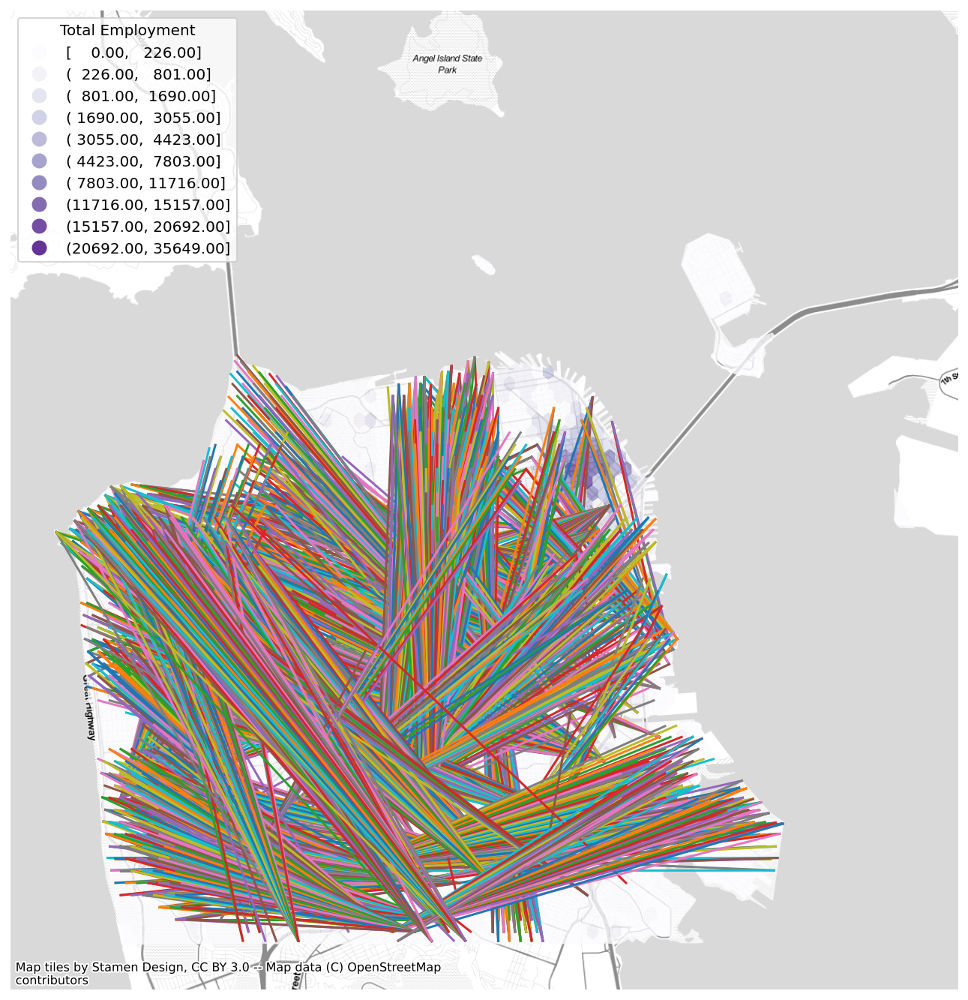

In [26]:
# Count number of time decreases
dec = len(ttm_all[ttm_all['c']<0])
print("No. Hexagon pairs with travel time decreases:", dec)

# Count number of time increases
inc = len(ttm_all[ttm_all['c']>0])
print("No. Hexagon pairs with travel time increases:", inc)

# Percent experiencing travel time increase
try: 
    per_inc = 100* inc / (dec+inc)
    print("Percent with travel time increase:", per_inc, "%")
except : 
    print("No travel time changes")
# Plot trips with travel time decreases
ttm_decrease = ttm_all[ttm_all['c']>0]

plot_trips(ttm_decrease['fromId'].values, ttm_decrease['toId'].values, hex_jobs)



In [27]:
# Count number of negative accessibility values
acc_pd = df_to_numeric(pd.DataFrame(acc.drop(columns='geometry')))
acc_pd[acc_pd < 0].count()['0_c':]

0_c       0
0_cp      0
10_c      0
10_cp     0
15_c      0
15_cp     0
20_c      1
20_cp     1
30_c      0
30_cp     0
40_c      0
40_cp     0
45_c      3
45_cp     3
50_c      2
50_cp     2
60_c      8
60_cp     8
70_c      4
70_cp     4
75_c      3
75_cp     3
80_c      5
80_cp     5
90_c      2
90_cp     2
100_c     0
100_cp    0
115_c     0
115_cp    0
110_c     0
110_cp    0
120_c     0
120_cp    0
dtype: int64

In [28]:
acc.describe().loc['min','0_c':]

0_c          0.000000
0_cp         0.000000
10_c         0.000000
10_cp        0.000000
15_c         0.000000
15_cp        0.000000
20_c      -250.000000
20_cp       -2.345876
30_c         0.000000
30_cp        0.000000
40_c         0.000000
40_cp        0.000000
45_c      -339.000000
45_cp       -0.061629
50_c     -7607.000000
50_cp       -1.552712
60_c     -4608.000000
60_cp       -0.793100
70_c     -1426.000000
70_cp       -0.271954
75_c      -975.000000
75_cp       -0.173876
80_c      -238.000000
80_cp       -0.041358
90_c      -290.000000
90_cp       -0.049508
100_c        0.000000
100_cp       0.000000
115_c        0.000000
115_cp       0.000000
110_c        0.000000
110_cp       0.000000
120_c        0.000000
120_cp       0.000000
Name: min, dtype: float64

## Data Visualization <a class="anchor" id="data_vis"></a>

We chose a few key visualizations to reveal how employment and acessibility varied across the city, as well as how it changed with the advent of the gondola.  The key plots are outlined below:

1. Employment Plot 

2. Bogota Accessibility Total Plot (no gondola case)

3. Bogota Acessibility Change Plot

4. Ciudad Bolivar Acessiblity Change Plot


### Employment Plot 

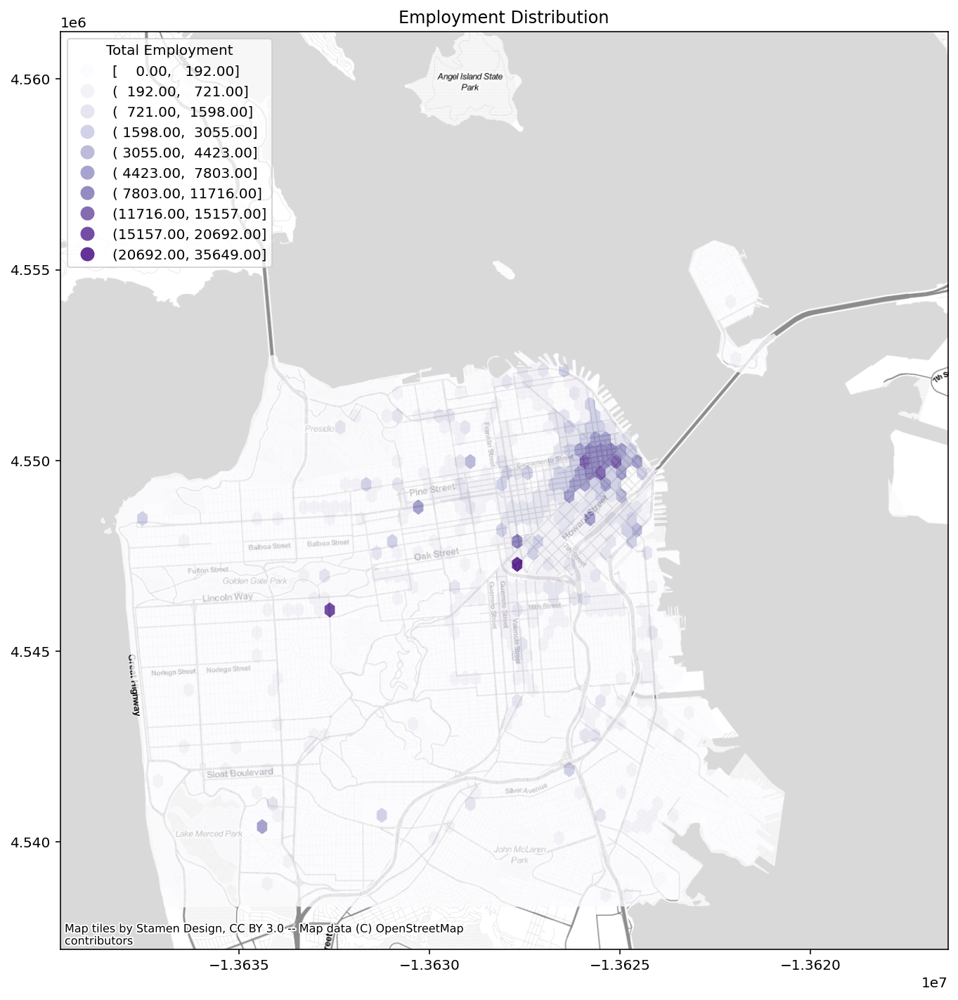

In [29]:
# 1 EMPLOYMENT PLOT 

# When using double square root, notice how it becomes clear how jobs are concentrated at some points and not others
hex_jobs_projected = hex_jobs
hex_jobs_projected['sqrt_jobs'] = np.sqrt(np.sqrt(hex_jobs_projected['jobs']))
hex_jobs_projected.crs = {'init':'epsg:4326'}
hex_jobs_projected = hex_jobs_projected.to_crs(epsg=3857)

# Figure Setup 
fig, ax = plt.subplots(1,1, figsize=(12,12))
plt.title('Employment Distribution')
#plt.axis('off')

# Plot Employment
hex_jobs_projected.plot(ax = ax, column = 'jobs', legend=True, legend_kwds={"loc":'upper left',"title":"Total Employment"}, cmap='Purples', alpha=0.8, scheme='naturalbreaks', k=10)

# Add Basemap
ctx.add_basemap(ax, url=ctx.providers.Stamen.TonerLite)

plt.savefig(run_path + 'plot1_employment.png', dpi=400)


### Plot Any Column in acc

In [30]:
# plot_acc 
# INPUTS: acc geopandas matrix with columns detailing accessibility counts 
# OUTPUTS: grid showing results results 
def plot_acc(acc, cols, title, run_path) :
    
    # Set crs
    if acc.crs != 3857 : 
        acc.crs = {'init':'epsg:4326'}
        acc.to_crs(epsg=3857, inplace=True)
        print('Updated CRS to 3857')
    
    if len(cols) == 0 :
        return "Put in columns of interest."
    
    if len(cols) == 1 :
        fig, ax = plt.subplots(1,1, figsize=(15,15))
        ax.axis('off')
        acc.plot(ax = ax, column = cols[0], legend=True, legend_kwds={"loc":'upper left'}, cmap='YlOrRd', alpha=0.8, scheme='naturalbreaks', k=9)      
        ctx.add_basemap(ax = ax, url=ctx.providers.Stamen.TonerLite)
        title = cols[0]
    
    else :
        # Open plot
        n = len(cols)
        num_col = 2
        num_row = max(2, int(math.ceil(n/num_col)))
        fig, axs = plt.subplots(num_row,num_col, figsize=(10*num_col,10*num_row))
        fig.suptitle(title, fontsize = 16)

        # For each column name in in col
        for i in range(n) : 
            # Find indices of column 
            r_id = math.floor(i/num_col)
            c_id = i%num_col
            print('r_id: ',r_id, '  c_id: ',c_id)
            axs[r_id,c_id].axis('off')
            axs[r_id,c_id].set_title(cols[i])

            #axs[r_id,c_id].plot(range(10),range(10))
            acc.plot(ax = axs[r_id,c_id], column = cols[i], legend=True, legend_kwds={"loc":'upper left'}, cmap='YlOrRd', alpha=0.8, scheme='naturalbreaks', k=9)      

            ctx.add_basemap(ax = axs[r_id,c_id], url=ctx.providers.Stamen.TonerLite)

    plt.savefig(run_path + title +'.png', dpi=400)
    
    return "Done"


Updated CRS to 3857


'Done'

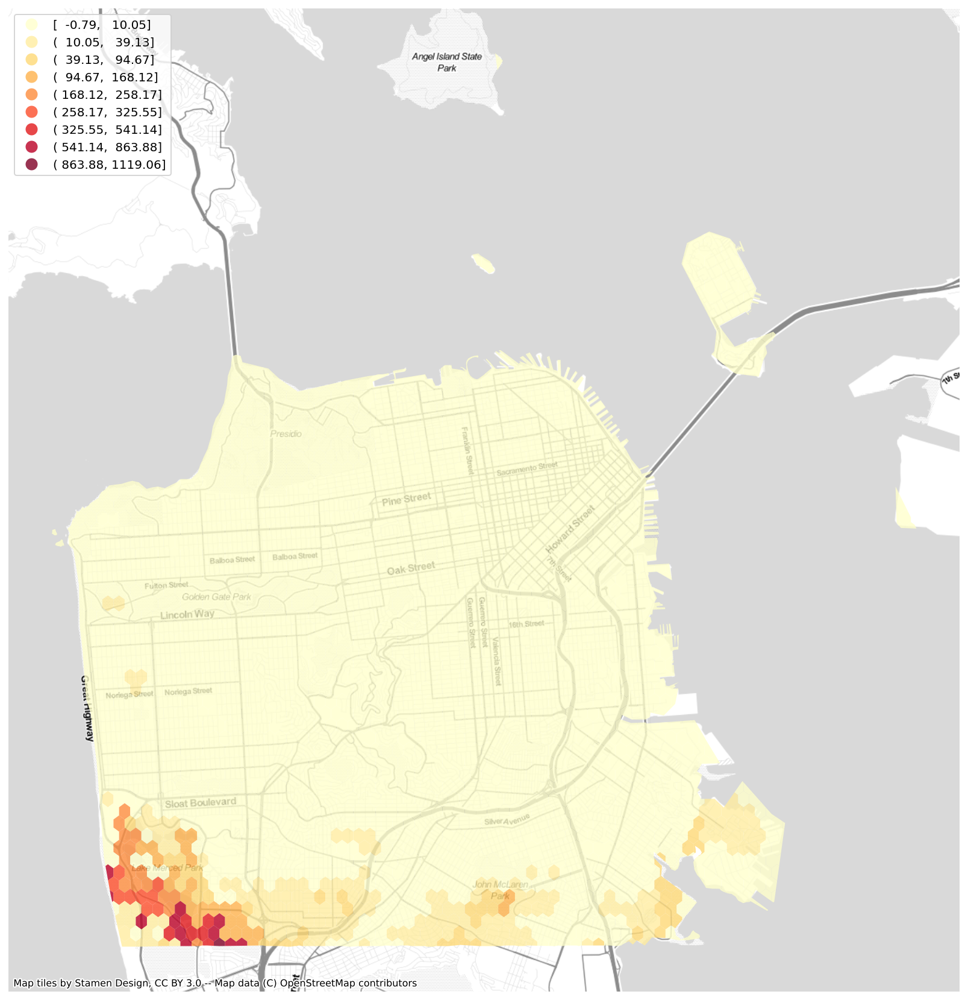

In [31]:
plot_acc(acc, ['60_cp'], '', run_path) 

### Acessibility Total Plot (pre data)

r_id:  0   c_id:  0
r_id:  0   c_id:  1
r_id:  1   c_id:  0
r_id:  1   c_id:  1


'Done'

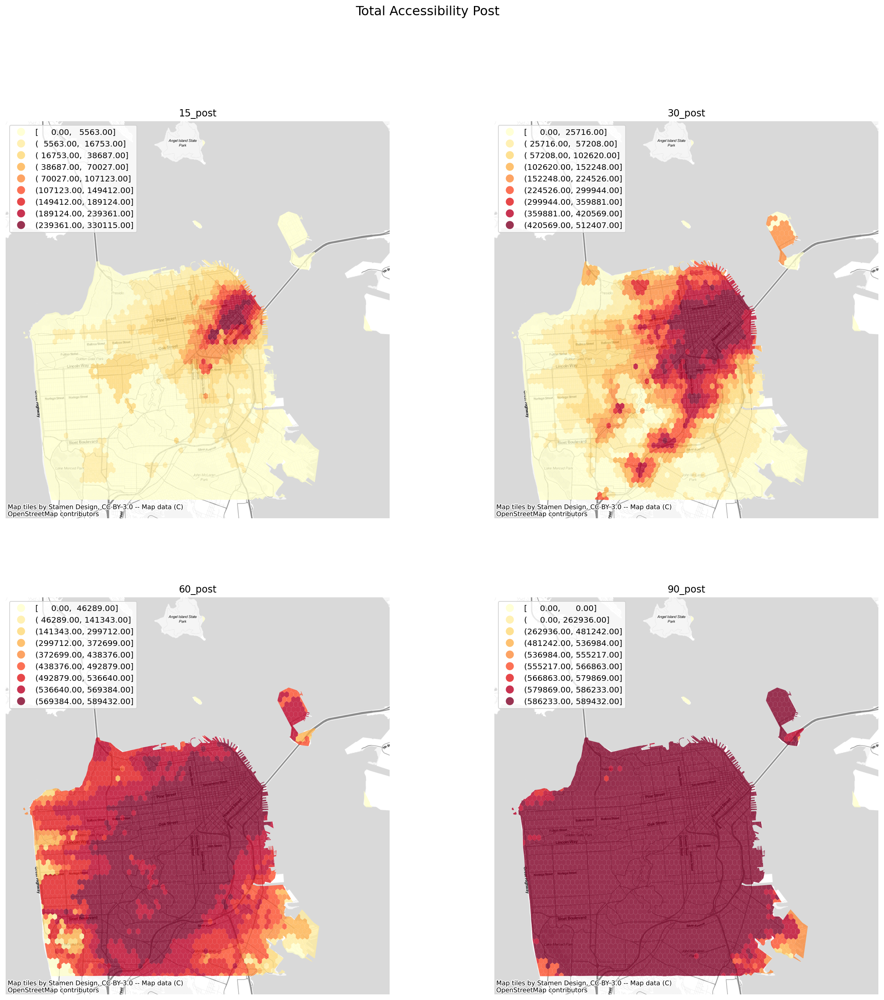

In [32]:
plot_acc(acc, ['15_post','30_post','60_post','90_post'], 'Total Accessibility Post', run_path)


r_id:  0   c_id:  0
r_id:  0   c_id:  1
r_id:  1   c_id:  0
r_id:  1   c_id:  1


'Done'

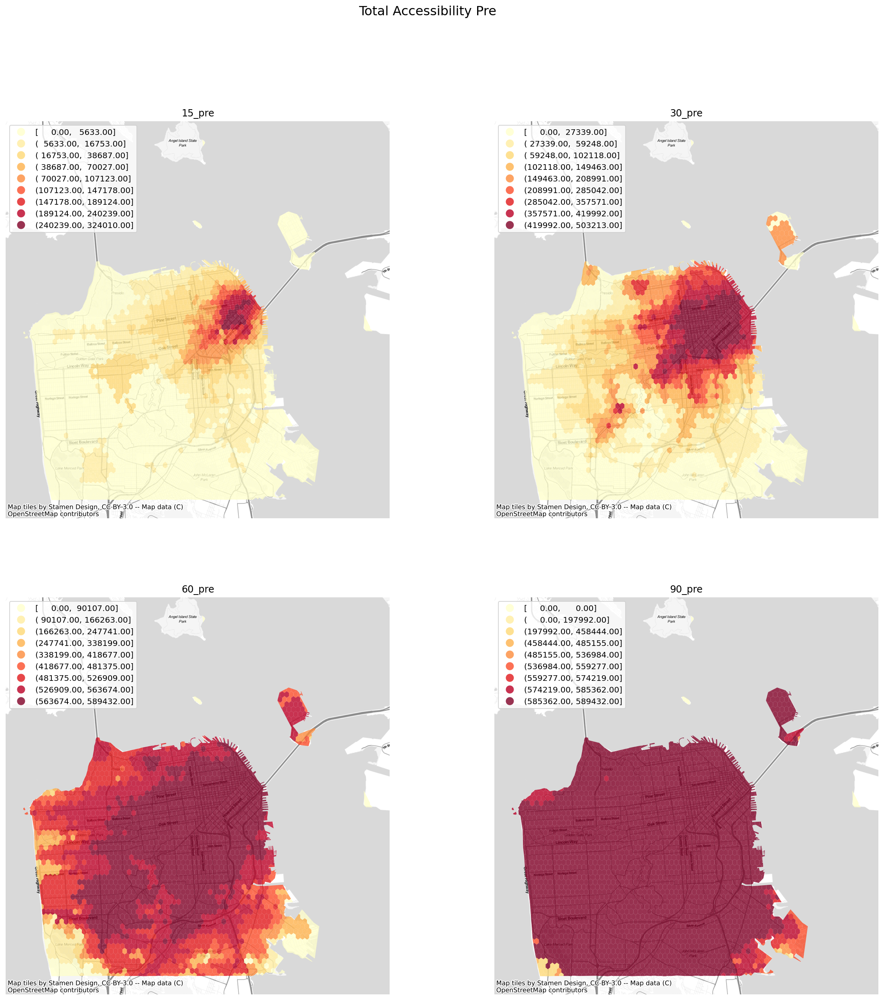

In [33]:
plot_acc(acc, ['15_pre','30_pre','60_pre','90_pre'], 'Total Accessibility Pre', run_path)


### Acessibility Change

r_id:  0   c_id:  0
r_id:  0   c_id:  1
r_id:  1   c_id:  0
r_id:  1   c_id:  1
r_id:  2   c_id:  0
r_id:  2   c_id:  1


'Done'

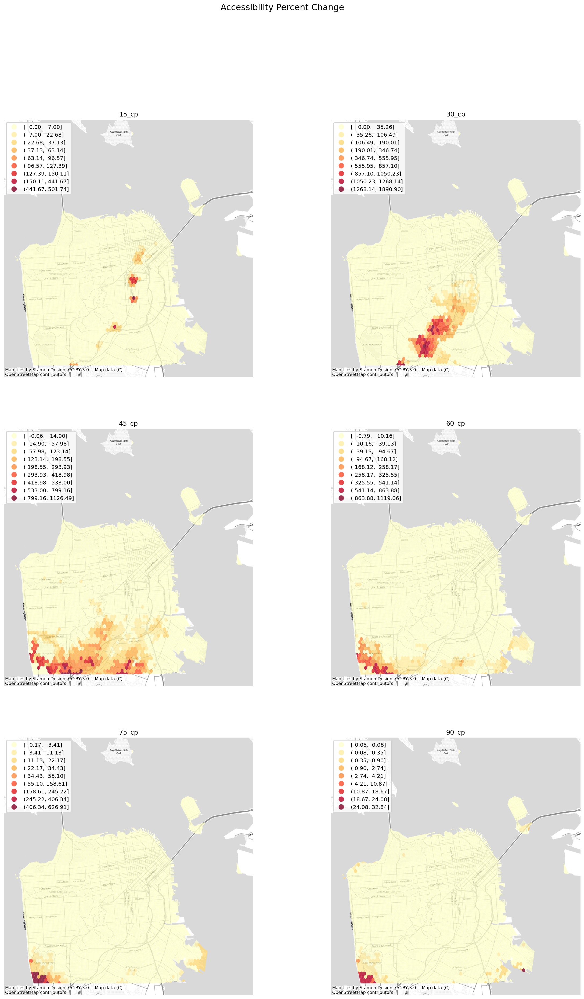

In [34]:
plot_acc(acc, ['15_cp','30_cp','45_cp', '60_cp','75_cp','90_cp'], 'Accessibility Percent Change', run_path)


## Scratchwork